# Sesiunea 19 din modulul 18-19_Matplotlib – Tehnici avansate de prezentare
_Notebook de exerciții (fără soluții) din seria 18-19_Matplotlib, construit pentru a rafina graficele dezvoltate în sesiunea 18 și a le pregăti pentru storytelling profesionist._


### Exercițiul 1 – Animație pulsantă cu FuncAnimation
Generează un semnal (de exemplu, o sinusoida) a cărui amplitudă se modifică în timp și transformă-l într-o animație folosind `matplotlib.animation.FuncAnimation`, cu funcții `init` și `update` bine definite. Adaugă linii de referință, configurează grila, actualizează o adnotare cu valoarea curentă și fixează limitele axelor pentru întreaga animație; poți include și o opțiune de schimbare a stilului Matplotlib. Asigură-te că animația rulează fără erori și că informația este lizibilă.

In [1]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import numpy as np
from IPython.display import HTML
from pathlib import Path

# VS Code dark-like colors
plt.rcParams.update({
    "axes.facecolor": "#1e1e1e",
    "figure.facecolor": "#1e1e1e",
    "axes.edgecolor": "#DDDDDD",
    "axes.labelcolor": "#DDDDDD",
    "xtick.color": "#CCCCCC",
    "ytick.color": "#CCCCCC",
    "text.color": "#DDDDDD",
    "grid.color": "#3a3a3a",
    "legend.edgecolor": "#1e1e1e",
    "legend.facecolor": "#2d2d30"
})

out_dir = Path("export")
out_dir.mkdir(exist_ok=True)

fig, ax = plt.subplots(figsize=(9, 4.5), dpi=130)
line, = ax.plot([], [], lw=2.6, color="#69ADF1", label="A(t) * sin(x)")
ax.axhline(0, color="white", lw=1, alpha=0.35)

x = np.linspace(0, 2 * np.pi, 500)
annotation = ax.text(0.02, 0.95, "", transform=ax.transAxes, va="top", color="#FFD166")

ax.set_xlim(0, 2 * np.pi)
ax.set_ylim(-2.5, 2.5)
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.set_title("Ex. 1 - Pulsating Sine with FuncAnimation")
ax.grid(alpha=0.35)
ax.legend(loc="upper right")


def init():
    line.set_data([], [])
    annotation.set_text("")
    return line, annotation


def update(frame):
    t = frame / 12.0
    amp = 1.2 + 0.9 * np.sin(t)
    phase = 0.7 * t
    y = amp * np.sin(x + phase)

    line.set_data(x, y)
    annotation.set_text(f"Frame: {frame:03d} | Amplitude: {amp:.2f}")
    return line, annotation


ani = FuncAnimation(fig, update, frames=180, init_func=init, interval=45, blit=True)

# Export animation as HTML for notebook/share
html_str = ani.to_jshtml()
(out_dir / "ex1_animation.html").write_text(html_str, encoding="utf-8")

# Export a representative static frame as PNG
update(90)
fig.savefig(out_dir / "ex1_animation_frame.png", dpi=300, bbox_inches="tight")

plt.close(fig)
HTML(html_str)


### Exercițiul 2 – Subploturi pentru vânzări trimestriale integrate cu Pandas
Construiește un `DataFrame` cu vânzări pe produse și trimestre (date sintetice sau reale), apoi creează trei subploturi: (1) bare pe produs, (2) linie pe trimestre și (3) cumul la zi. Folosește metodele Pandas cu backend Matplotlib, personalizează tick-urile, adaugă grilă și linii de referință pentru obiective, iar la final sincronizează axele și legendă pentru o prezentare coerentă. Verifică că graficul este clar, complet și fără erori.


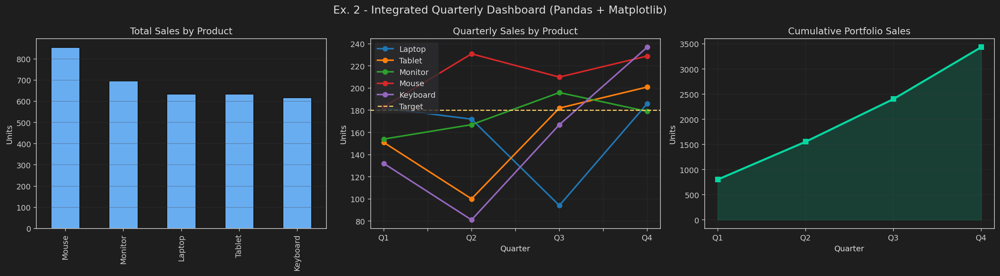

,Q1,Q2,Q3,Q4
Laptop,182,172,94,186
Tablet,151,100,182,201
Monitor,154,167,196,179
Mouse,183,231,210,229
Keyboard,132,81,167,237


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# VS Code dark-like colors
plt.rcParams.update({
    "axes.facecolor": "#1e1e1e",
    "figure.facecolor": "#1e1e1e",
    "axes.edgecolor": "#DDDDDD",
    "axes.labelcolor": "#DDDDDD",
    "xtick.color": "#CCCCCC",
    "ytick.color": "#CCCCCC",
    "text.color": "#DDDDDD",
    "grid.color": "#3a3a3a",
    "legend.edgecolor": "#1e1e1e",
    "legend.facecolor": "#2d2d30"
})

out_dir = Path("export")
out_dir.mkdir(exist_ok=True)

np.random.seed(42)
products = ["Laptop", "Tablet", "Monitor", "Mouse", "Keyboard"]
quarters = ["Q1", "Q2", "Q3", "Q4"]

raw = np.random.randint(80, 240, size=(len(products), len(quarters)))
df = pd.DataFrame(raw, index=products, columns=quarters)

fig, axes = plt.subplots(1, 3, figsize=(18, 5), dpi=140)

product_totals = df.sum(axis=1).sort_values(ascending=False)
product_totals.plot(kind="bar", ax=axes[0], color="#69ADF1", edgecolor="#111")
axes[0].set_title("Total Sales by Product")
axes[0].set_ylabel("Units")
axes[0].grid(axis="y", alpha=0.35)

df.T.plot(ax=axes[1], marker="o", linewidth=2)
axes[1].set_title("Quarterly Sales by Product")
axes[1].set_xlabel("Quarter")
axes[1].set_ylabel("Units")
axes[1].grid(alpha=0.35)
axes[1].axhline(180, color="#FFD166", ls="--", lw=1.4, label="Target")
axes[1].legend(loc="upper left")

quarter_totals = df.sum(axis=0)
quarter_cum = quarter_totals.cumsum()
axes[2].plot(quarters, quarter_cum.values, color="#06D6A0", marker="s", linewidth=2.6)
axes[2].fill_between(quarters, quarter_cum.values, color="#06D6A0", alpha=0.18)
axes[2].set_title("Cumulative Portfolio Sales")
axes[2].set_xlabel("Quarter")
axes[2].set_ylabel("Units")
axes[2].grid(alpha=0.35)

fig.suptitle("Ex. 2 - Integrated Quarterly Dashboard (Pandas + Matplotlib)", fontsize=14)
plt.tight_layout()
fig.savefig(out_dir / "ex2_quarterly_dashboard.png", dpi=300, bbox_inches="tight")
plt.show()

df


### Exercițiul 3 – Heatmap de temperaturi cu personalizare completă
Generează o matrice de temperaturi (de exemplu, 12 luni × 24 ore sau orașe × luni) și afișeaz-o ca heatmap cu `imshow` ori `pcolormesh`, adăugând o bară de culori. Personalizează tick-urile cu etichete semnificative, inserează valori direct pe celule cu contrast lizibil și experimentează cu două stiluri Matplotlib (`seaborn`, `fivethirtyeight` etc.) pentru a compara lizibilitatea.


/tmp/ipykernel_174319/196683857.py:44: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


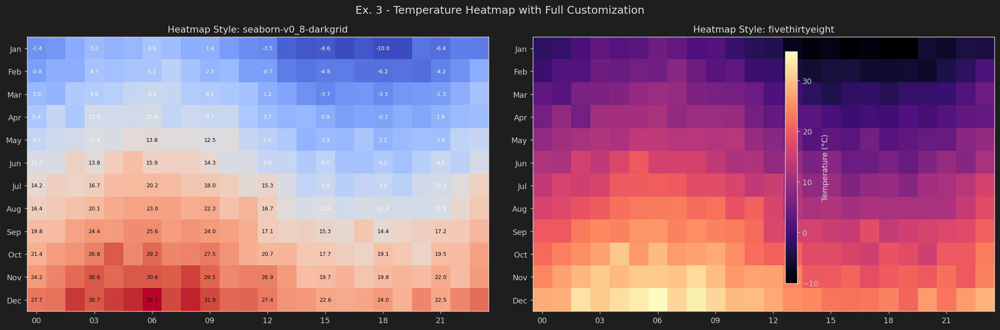

In [3]:
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

out_dir = Path("export")
out_dir.mkdir(exist_ok=True)

np.random.seed(42)
months = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
hours = [f"{h:02d}" for h in range(24)]

base = np.linspace(-3, 28, 12).reshape(-1, 1)
daily_wave = 6 * np.sin(np.linspace(0, 2 * np.pi, 24))
noise = np.random.normal(0, 1.2, (12, 24))
temp = base + daily_wave + noise

fig, axes = plt.subplots(1, 2, figsize=(18, 6), dpi=130)

with plt.style.context("seaborn-v0_8-darkgrid"):
    im1 = axes[0].imshow(temp, cmap="coolwarm", aspect="auto")
axes[0].set_title("Heatmap Style: seaborn-v0_8-darkgrid")
axes[0].set_xticks(range(0, 24, 3))
axes[0].set_xticklabels([hours[i] for i in range(0, 24, 3)])
axes[0].set_yticks(range(12))
axes[0].set_yticklabels(months)

with plt.style.context("fivethirtyeight"):
    im2 = axes[1].imshow(temp, cmap="magma", aspect="auto")
axes[1].set_title("Heatmap Style: fivethirtyeight")
axes[1].set_xticks(range(0, 24, 3))
axes[1].set_xticklabels([hours[i] for i in range(0, 24, 3)])
axes[1].set_yticks(range(12))
axes[1].set_yticklabels(months)

for r in range(12):
    for c in range(0, 24, 3):
        v = temp[r, c]
        txt_color = "white" if v < temp.mean() else "black"
        axes[0].text(c, r, f"{v:.1f}", ha="center", va="center", fontsize=7, color=txt_color)

cbar = fig.colorbar(im2, ax=axes, shrink=0.9)
cbar.set_label("Temperature (°C)")
fig.suptitle("Ex. 3 - Temperature Heatmap with Full Customization", fontsize=14)
plt.tight_layout()
fig.savefig(out_dir / "ex3_heatmap_comparison.png", dpi=300, bbox_inches="tight")
plt.show()


### Exercițiul 4 – Interval de încredere cu fill_between
Pornește de la o serie (cum ar fi o medie mobilă) și construiește limite inferioare și superioare, apoi folosește `fill_between` pentru a evidenția zona dintre ele. Adaugă legendă și o adnotare care explică intervalul, ajustează grila și limitele axelor pentru claritate și experimentează cu transparența sau pattern-uri pentru zona umplută.


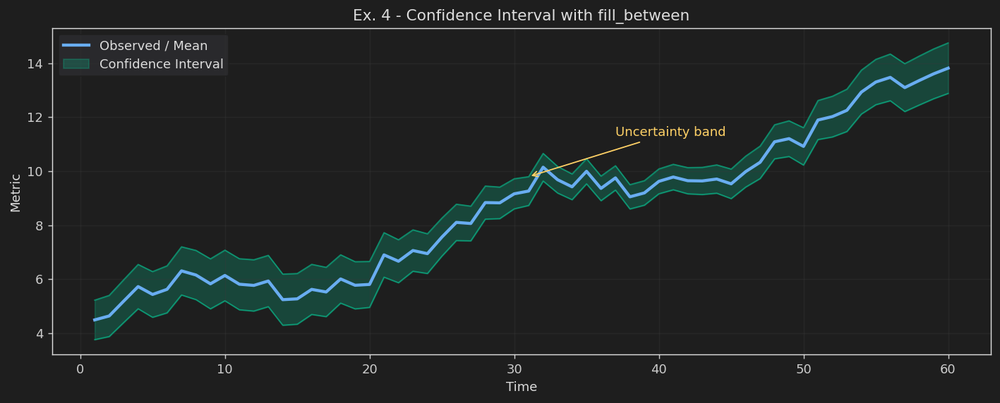

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# VS Code dark-like colors
plt.rcParams.update({
    "axes.facecolor": "#1e1e1e",
    "figure.facecolor": "#1e1e1e",
    "axes.edgecolor": "#DDDDDD",
    "axes.labelcolor": "#DDDDDD",
    "xtick.color": "#CCCCCC",
    "ytick.color": "#CCCCCC",
    "text.color": "#DDDDDD",
    "grid.color": "#3a3a3a",
    "legend.edgecolor": "#1e1e1e",
    "legend.facecolor": "#2d2d30"
})

out_dir = Path("export")
out_dir.mkdir(exist_ok=True)

np.random.seed(42)
x = np.arange(1, 61)
trend = 0.15 * x + 4 + 0.8 * np.sin(x / 4)
noise = np.random.normal(0, 0.3, len(x))
mean_series = trend + noise

ci_width = 0.7 + 0.25 * np.sin(x / 8)
lower = mean_series - ci_width
upper = mean_series + ci_width

plt.figure(figsize=(11, 4.5), dpi=130)
plt.plot(x, mean_series, color="#69ADF1", lw=2.4, label="Observed / Mean")
plt.fill_between(x, lower, upper, color="#06D6A0", alpha=0.22, label="Confidence Interval")
plt.plot(x, lower, color="#06D6A0", lw=1, alpha=0.5)
plt.plot(x, upper, color="#06D6A0", lw=1, alpha=0.5)

mid = len(x) // 2
plt.annotate(
    "Uncertainty band",
    xy=(x[mid], upper[mid]),
    xytext=(x[mid] + 6, upper[mid] + 1.5),
    arrowprops=dict(arrowstyle="->", color="#FFD166"),
    color="#FFD166",
)

plt.title("Ex. 4 - Confidence Interval with fill_between")
plt.xlabel("Time")
plt.ylabel("Metric")
plt.grid(alpha=0.35)
plt.legend(loc="upper left")
plt.tight_layout()
plt.savefig(out_dir / "ex4_confidence_interval.png", dpi=300, bbox_inches="tight")
plt.show()


### Exercițiul 5 – Prezentare în stil dark_background
Recreează un grafic din setul tău folosind stilul `dark_background`, reglând culorile liniilor, markerilor și textului pentru un contrast optim. Personalizează tick-urile și grid-ul astfel încât să rămână vizibile pe fundal închis, adaugă adnotări și linii de referință relevante și exportă figura la o rezoluție potrivită pentru rapoarte sau slide-uri.


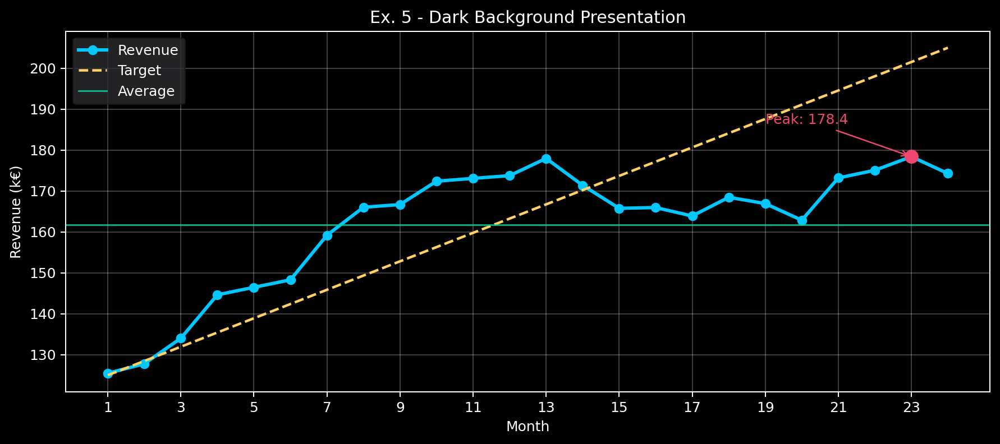

In [5]:
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path

plt.style.use("dark_background")

np.random.seed(42)
x = np.arange(1, 25)
revenue = 120 + np.cumsum(np.random.normal(3, 5, len(x)))
target = np.linspace(125, 205, len(x))

fig, ax = plt.subplots(figsize=(10, 4.5), dpi=180)
ax.plot(x, revenue, marker="o", color="#00C8FF", lw=2.4, label="Revenue")
ax.plot(x, target, color="#FFD166", lw=1.8, ls="--", label="Target")

peak_idx = int(np.argmax(revenue))
ax.scatter(x[peak_idx], revenue[peak_idx], s=80, color="#EF476F", zorder=5)
ax.annotate(
    f"Peak: {revenue[peak_idx]:.1f}",
    xy=(x[peak_idx], revenue[peak_idx]),
    xytext=(x[peak_idx] - 4, revenue[peak_idx] + 8),
    arrowprops=dict(arrowstyle="->", color="#EF476F"),
    color="#EF476F"
)

ax.axhline(revenue.mean(), color="#06D6A0", lw=1.2, alpha=0.8, label="Average")
ax.grid(alpha=0.25)
ax.set_title("Ex. 5 - Dark Background Presentation")
ax.set_xlabel("Month")
ax.set_ylabel("Revenue (k€)")
ax.set_xticks(np.arange(1, 25, 2))
ax.legend(loc="upper left")

out_dir = Path("export")
out_dir.mkdir(exist_ok=True)
fig.savefig(out_dir / "ex5_dark_background.png", dpi=300, bbox_inches="tight")
fig.savefig(out_dir / "ex5_dark_background.pdf", dpi=300, bbox_inches="tight")

plt.tight_layout()
plt.show()
